## 3. Modelling

### PART-1: GAN 

A Generative Adversarial Network (GAN) is a type of artificial intelligence that consists of two networks, a generator and a discriminator. The generator creates fake data, like images or text, while the discriminator tries to tell if the data is real or fake. They compete against each other, making each other better over time. GANs have been used to make realistic images, videos, and more, and they have the potential to revolutionize many industries.

In this module, I will create a simple GAN model and evalute it's performance using Generator and Discriminator losses.

In [ ]:
# Import the necessary libraries
import numpy as np
import pandas as pd
import os
import time
import gc
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import zipfile
from PIL import Image
from tqdm import tqdm

import tensorflow as tf
from sklearn import preprocessing
%matplotlib inline

import keras
from keras.layers import Dense, Dropout, Input
from keras.models import Model,Sequential
from keras.layers import LeakyReLU
from keras.optimizers import Adam

#### A. DATA EXTRACTION 

In [ ]:
# Set the root directory path
ROOT = ''

# Get the list of images in the 'all-dogs' directory
IMAGES = os.listdir(ROOT + 'all-dogs/')

# Get the list of breeds in the 'Annotation' directory
breeds = os.listdir(ROOT + 'Annotation/')

# Initialize variables
idxIn = 0
namesIn = []
imagesIn = np.zeros((25000, 80, 80, 3))

# Iterate over breeds using tqdm for progress tracking
pbar_breeds = tqdm(breeds, desc='Processing Breeds', leave=False)
for breed in pbar_breeds:
    # Iterate over dogs in each breed
    for dog in os.listdir(ROOT + 'Annotation/' + breed):
        try:
            # Open the image file
            img = Image.open(ROOT + 'all-dogs/' + dog + '.jpg')
        except:
            continue
        
        # Get the width and height of the image
        ww, hh = img.size
        
        # Parse the XML annotation file
        tree = ET.parse(ROOT + 'Annotation/' + breed + '/' + dog)
        root = tree.getroot()
        
        # Find all objects in the annotation file
        objects = root.findall('object')
        
        # Process each object
        for o in objects:
            # Find the bounding box coordinates
            bndbox = o.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            
            # Calculate the width of the bounding box
            w = np.min((xmax - xmin, ymax - ymin))
            
            # Add padding to the crops
            EXTRA = w // 8
            a1 = EXTRA
            a2 = EXTRA
            b1 = EXTRA
            b2 = EXTRA
            a1 = np.min((a1, xmin))
            a2 = np.min((a2, ww - xmin - w))
            b1 = np.min((b1, ymin))
            b2 = np.min((b2, hh - ymin - w))
            
            # Crop and resize the image
            img2 = img.crop((xmin - a1, ymin - b1, xmin + w + a2, ymin + w + b2))
            img2 = img2.resize((80, 80), Image.ANTIALIAS)
            
            # Store the image and breed name in the respective arrays
            imagesIn[idxIn, :, :, :] = np.asarray(img2)
            namesIn.append(breed)
            idxIn += 1

# Shuffle the data
idx = np.arange(idxIn)
np.random.shuffle(idx)
imagesIn = imagesIn[idx, :, :, :]
namesIn = np.array(namesIn)[idx]


#### B. DATA TRANSFORMATION

In [ ]:
# Normalize the input images
imagesIn = (imagesIn[:idxIn, :, :, :] - 127.5) / 127.5

# Convert the data type to float32
imagesIn = imagesIn.astype('float32')

# Get the shape of the input images
imagesIn.shape


(22109, 80, 80, 3)

In [ ]:
# Assuming imagesIn has a shape of (22109, 80, 80, 3)
imagesIn = imagesIn.reshape(22109, 19200)
imagesIn.shape

(22109, 19200)

### C. MODELLING PIPELINE

In [ ]:
def adam_optimizer():
    # Create and return an Adam optimizer with specific hyperparameters
    return Adam(lr=0.0002, beta_1=0.5)


In [ ]:
def create_generator():
    # Initialize the generator model
    generator = Sequential()

    # Add a dense layer with 256 units and input dimension of 100
    generator.add(Dense(units=256, input_dim=100))
    generator.add(LeakyReLU(0.2))  # Apply LeakyReLU activation

    # Add a dense layer with 512 units
    generator.add(Dense(units=512))
    generator.add(LeakyReLU(0.2))  # Apply LeakyReLU activation

    # Add a dense layer with 1024 units
    generator.add(Dense(units=1024))
    generator.add(LeakyReLU(0.2))  # Apply LeakyReLU activation

    # Add a dense layer with 784 units and 'tanh' activation
    generator.add(Dense(units=19200, activation='tanh'))

    # Compile the generator model with binary cross-entropy loss and an optimizer
    generator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())

    return generator

# Create an instance of the generator model
generator = create_generator()

# Print the summary of the generator model
generator.summary()


Model: "sequential"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense (Dense)               (None, 256)               25856     

                                                                 

 leaky_re_lu (LeakyReLU)     (None, 256)               0         

                                                                 

 dense_1 (Dense)             (None, 512)               131584    

                                                                 

 leaky_re_lu_1 (LeakyReLU)   (None, 512)               0         

                                                                 

 dense_2 (Dense)             (None, 1024)              525312    

                                                                 

 leaky_re_lu_2 (LeakyReLU)   (None, 1024)              0         

                                                                 

 dense_3 (Dense)             (None, 1920

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.

  super().__init__(name, **kwargs)


In [ ]:
def create_discriminator():
    # Initialize the discriminator model
    discriminator = Sequential()

    # Add a dense layer with 1024 units and an input dimension of 19200
    discriminator.add(Dense(units=1024, input_dim=19200))
    discriminator.add(LeakyReLU(0.2))  # Apply LeakyReLU activation
    discriminator.add(Dropout(0.3))  # Apply Dropout regularization

    # Add a dense layer with 512 units
    discriminator.add(Dense(units=512))
    discriminator.add(LeakyReLU(0.2))  # Apply LeakyReLU activation
    discriminator.add(Dropout(0.3))  # Apply Dropout regularization

    # Add a dense layer with 256 units
    discriminator.add(Dense(units=256))
    discriminator.add(LeakyReLU(0.2))  # Apply LeakyReLU activation

    # Add a dense layer with 1 unit and sigmoid activation
    discriminator.add(Dense(units=1, activation='sigmoid'))

    # Compile the discriminator model with binary cross-entropy loss and an optimizer
    discriminator.compile(loss='binary_crossentropy', optimizer=adam_optimizer())

    return discriminator

# Create an instance of the discriminator model
discriminator = create_discriminator()

# Print the summary of the discriminator model
discriminator.summary()


Model: "sequential_1"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 dense_4 (Dense)             (None, 1024)              19661824  

                                                                 

 leaky_re_lu_3 (LeakyReLU)   (None, 1024)              0         

                                                                 

 dropout (Dropout)           (None, 1024)              0         

                                                                 

 dense_5 (Dense)             (None, 512)               524800    

                                                                 

 leaky_re_lu_4 (LeakyReLU)   (None, 512)               0         

                                                                 

 dropout_1 (Dropout)         (None, 512)               0         

                                                                 

 dense_6 (Dense)             (None, 25

In [ ]:
def create_gan(discriminator, generator):
    # Set the discriminator to be non-trainable
    discriminator.trainable = False

    # Define the input shape for the GAN
    gan_input = Input(shape=(100,))

    # Generate fake images using the generator model
    x = generator(gan_input)

    # Pass the generated images through the discriminator
    gan_output = discriminator(x)

    # Create the GAN model
    gan = Model(inputs=gan_input, outputs=gan_output)

    # Compile the GAN model with binary cross-entropy loss and optimizer
    gan.compile(loss='binary_crossentropy', optimizer='adam')

    return gan

# Create the GAN model by passing the discriminator and generator models
gan = create_gan(discriminator, generator)

# Print the summary of the GAN model
gan.summary()



Model: "model"

_________________________________________________________________

 Layer (type)                Output Shape              Param #   


 input_1 (InputLayer)        [(None, 100)]             0         

                                                                 

 sequential (Sequential)     (None, 19200)             20362752  

                                                                 

 sequential_1 (Sequential)   (None, 1)                 20318209  

                                                                 


Total params: 40,680,961

Trainable params: 20,362,752

Non-trainable params: 20,318,209

_________________________________________________________________


In [ ]:

def plot_generated_images(epoch, generator, examples=25, dim=(5, 5), figsize=(10, 10)):
    # Generate random noise for input to the generator
    noise = np.random.normal(loc=0, scale=1, size=[examples, 100])

    # Generate images using the generator model
    generated_images = generator.predict(noise)

    # Reshape the generated images to the appropriate shape
    generated_images = generated_images.reshape(examples, 80, 80, 3)

    # Create a new figure with the specified size
    plt.figure(figsize=figsize)

    # Plot the generated images
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest')
        plt.axis('off')

    # Adjust the layout and save the figure
    plt.tight_layout()

    plt.show()


In [ ]:

def training(epochs=1, batch_size=128):
    # Calculate the number of batches per epoch
    batch_count = int(imagesIn.shape[0] / batch_size)

    # Create the generator, discriminator, and GAN models
    generator = create_generator()
    discriminator = create_discriminator()
    gan = create_gan(discriminator, generator)

    gen_loss_history = []  # List to store generator loss values
    disc_loss_history = []  # List to store discriminator loss values

    for e in range(1, epochs+1):
        print("Epoch %d" % e)
        disc_loss_total = 0.0
        gen_loss_total = 0.0
        
        for _ in range(batch_count):
            # Generate random noise as input to the generator
            noise = np.random.normal(0, 1, [batch_size, 100])

            # Generate fake images from the noise input using the generator
            generated_images = generator.predict(noise)

            # Get a random set of real images from the training data
            image_batch = imagesIn[np.random.randint(low=0, high=imagesIn.shape[0], size=batch_size)]

            # Construct different batches of real and fake data
            X = np.concatenate([image_batch, generated_images])

            # Labels for generated and real data
            y_dis = np.zeros(2 * batch_size)
            y_dis[:batch_size] = 0.9

            # Pretrain the discriminator on fake and real data before starting the GAN training
            discriminator.trainable = True
            disc_loss = discriminator.train_on_batch(X, y_dis)
            disc_loss_total += disc_loss

            # Trick the discriminator by passing noised input of the generator as real data
            noise = np.random.normal(0, 1, [batch_size, 100])
            y_gen = np.ones(batch_size)

            # During the training of the GAN, the weights of the discriminator should be fixed.
            # Enforce that by setting the trainable flag of the discriminator to False.
            discriminator.trainable = False

            # Train the GAN by alternating the training of the discriminator and the chained GAN model
            gen_loss = gan.train_on_batch(noise, y_gen)
            gen_loss_total += gen_loss

        avg_disc_loss = disc_loss_total / batch_count
        avg_gen_loss = gen_loss_total / batch_count

        print("Generator Loss: %.4f" % avg_gen_loss)
        print("Discriminator Loss: %.4f" % avg_disc_loss)

        # Store the losses in the history lists
        gen_loss_history.append(avg_gen_loss)
        disc_loss_history.append(avg_disc_loss)

        # Plot generated images at the specified epochs
        if e == 1 or e % 20 == 0:
            plot_generated_images(e, generator, examples=25, dim=(5, 5), figsize=(10, 10))

    # Plot the overall generator and discriminator loss after 500 epochs
    plt.plot(range(1, epochs+1), gen_loss_history, label='Generator Loss')
    plt.plot(range(1, epochs+1), disc_loss_history, label='Discriminator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Generator and Discriminator Loss')
    plt.show()

    # Calculate the final accuracy
    final_acc = (1 - avg_disc_loss) * 100

    # Print the final accuracy
    print("Final Accuracy: %.2f%%" % final_acc)


Epoch 1

4/4 [==============================] - 3s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4

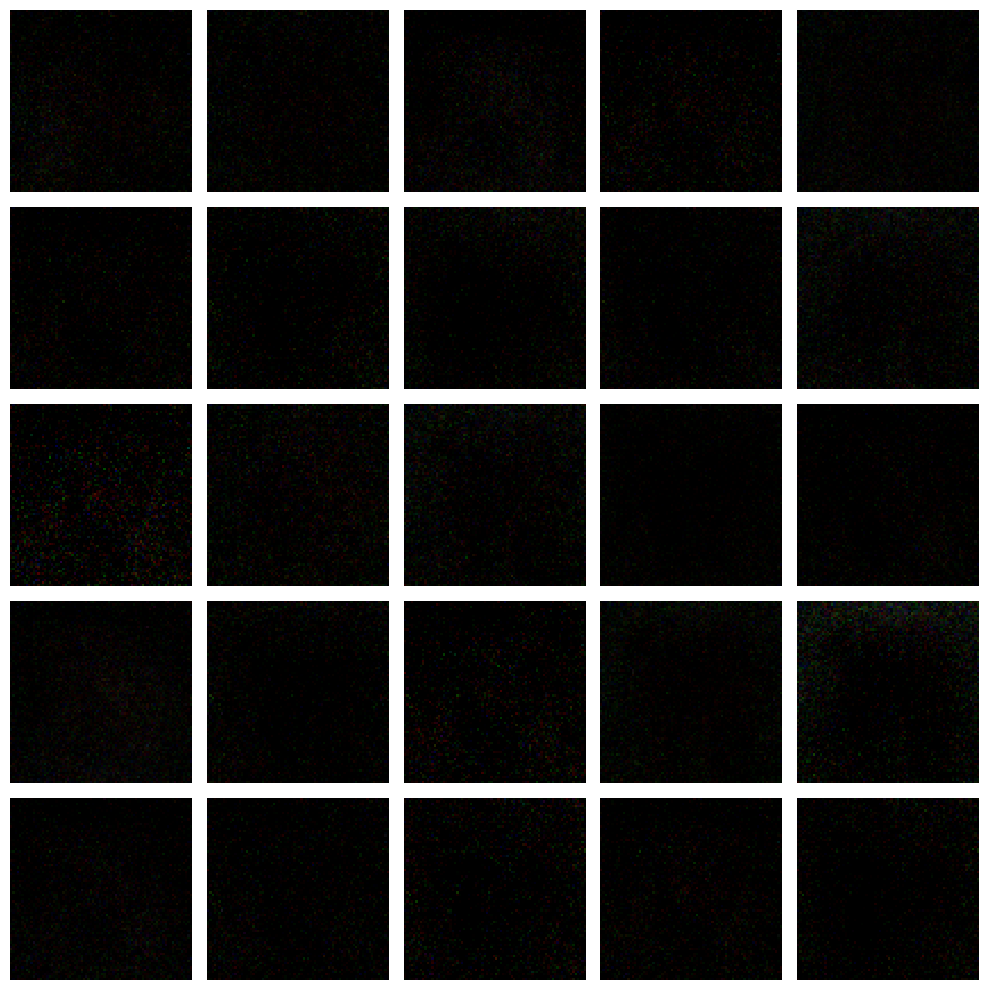

Epoch 2

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4

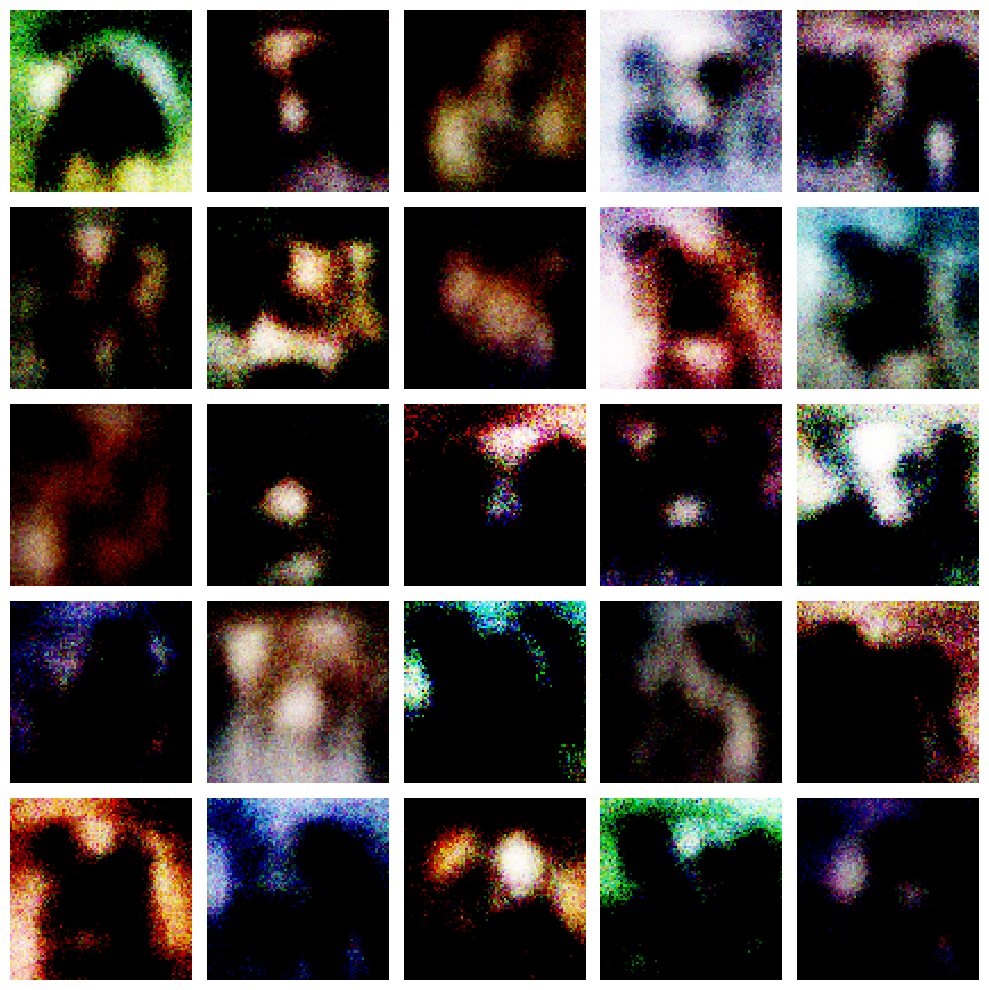

Epoch 21

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/

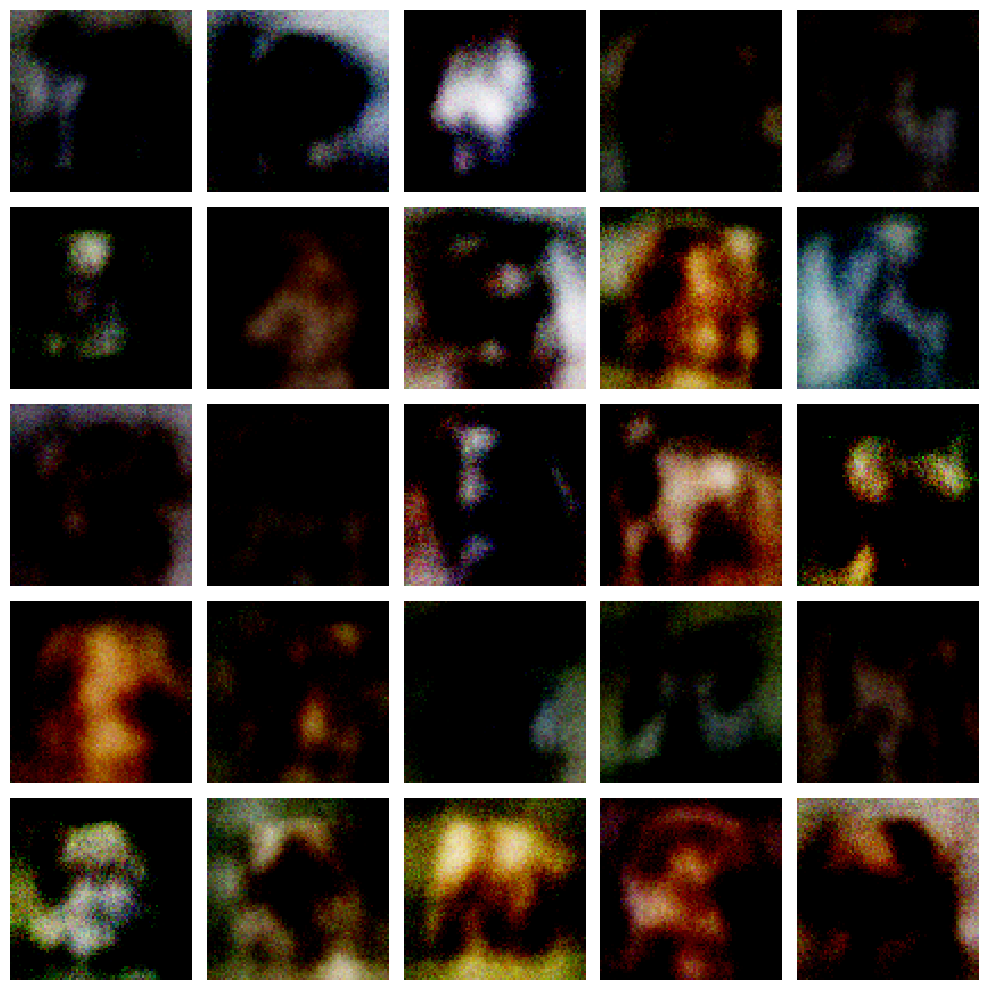

Epoch 41

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/

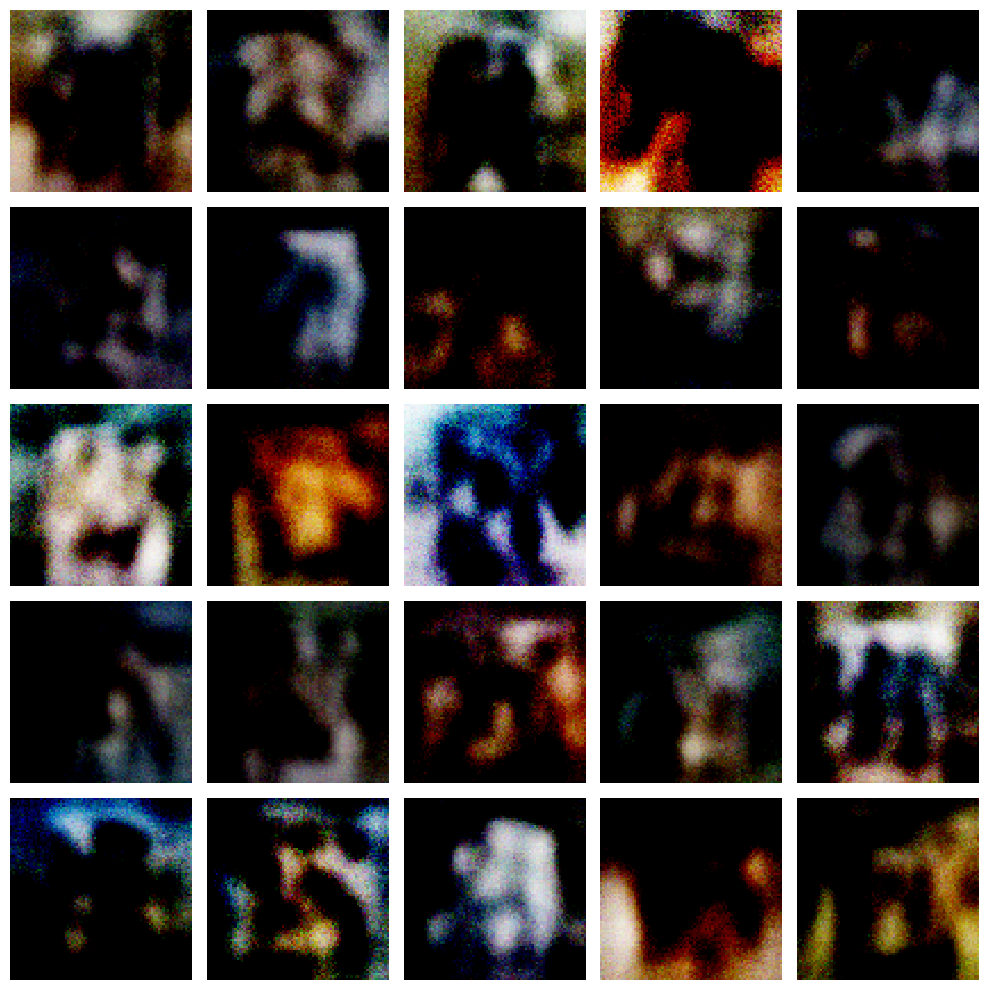

Epoch 61

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/

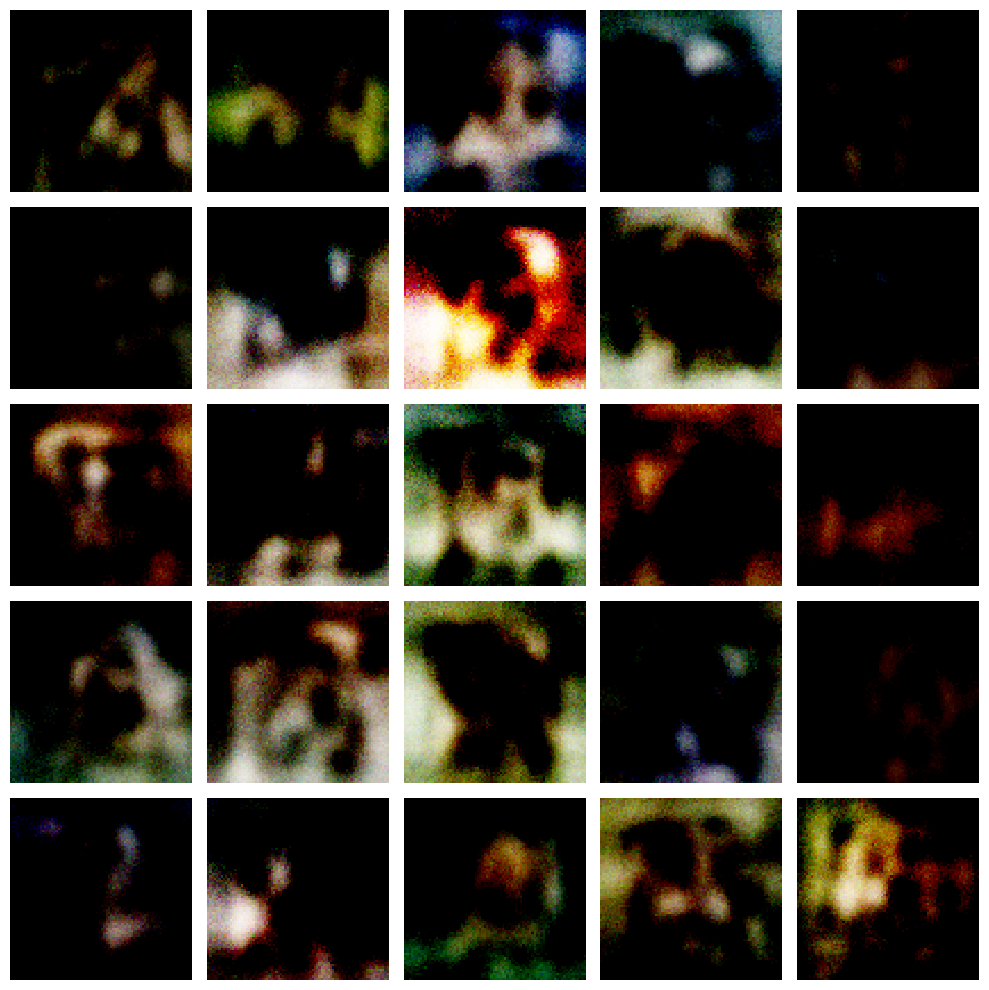

Epoch 81

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/

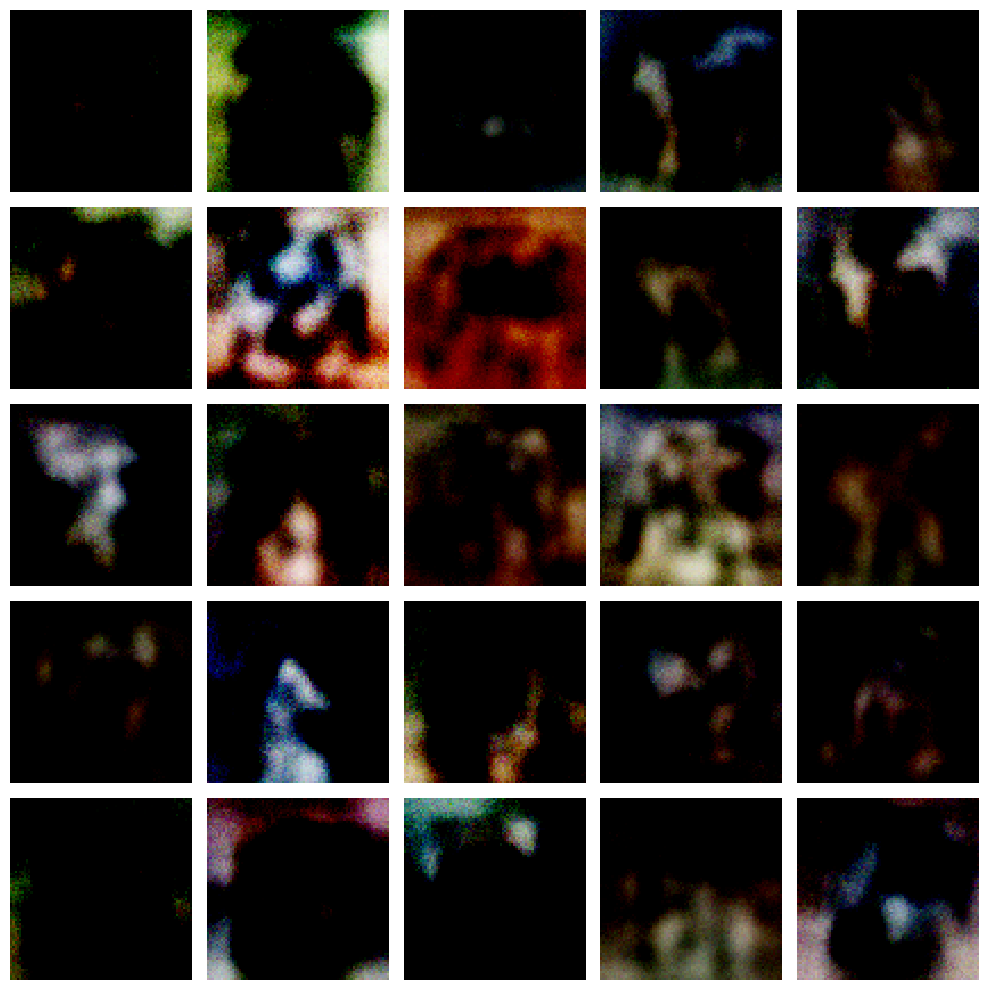

Epoch 101

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

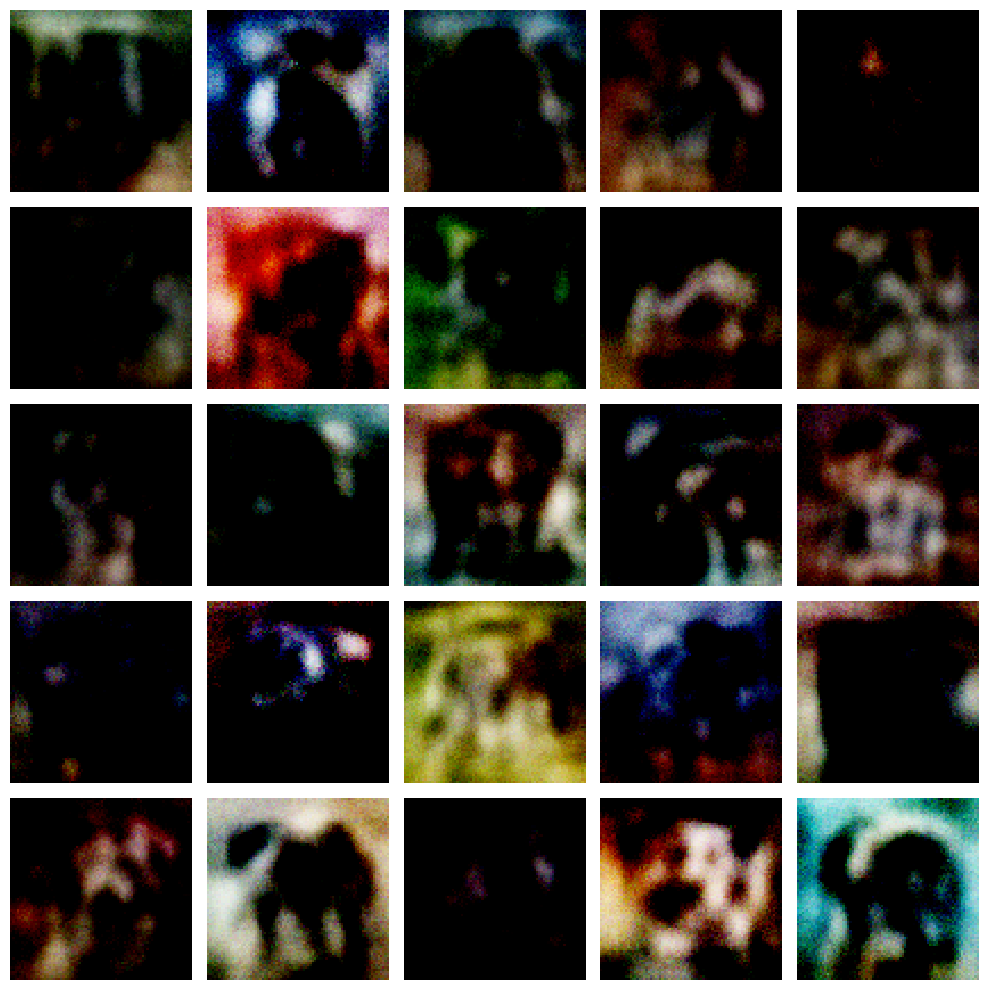

Epoch 121

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

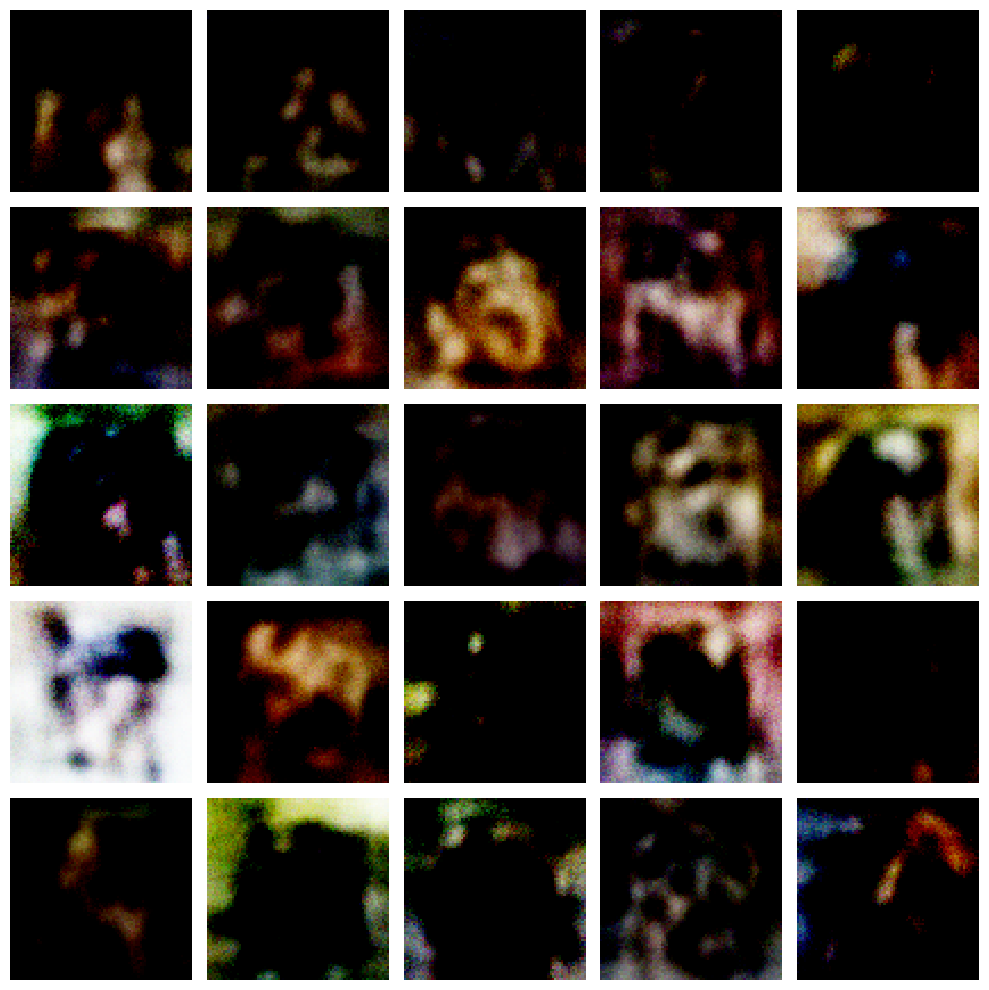

Epoch 141

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

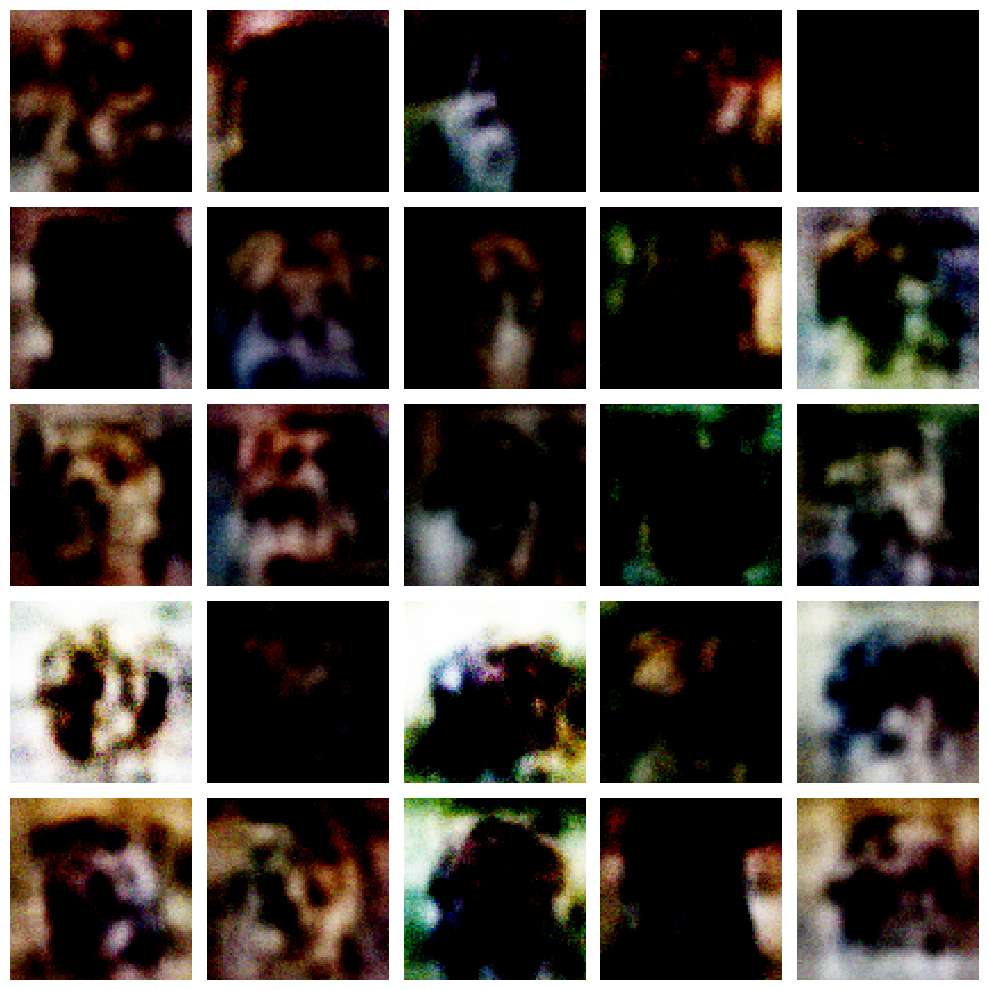

Epoch 161

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

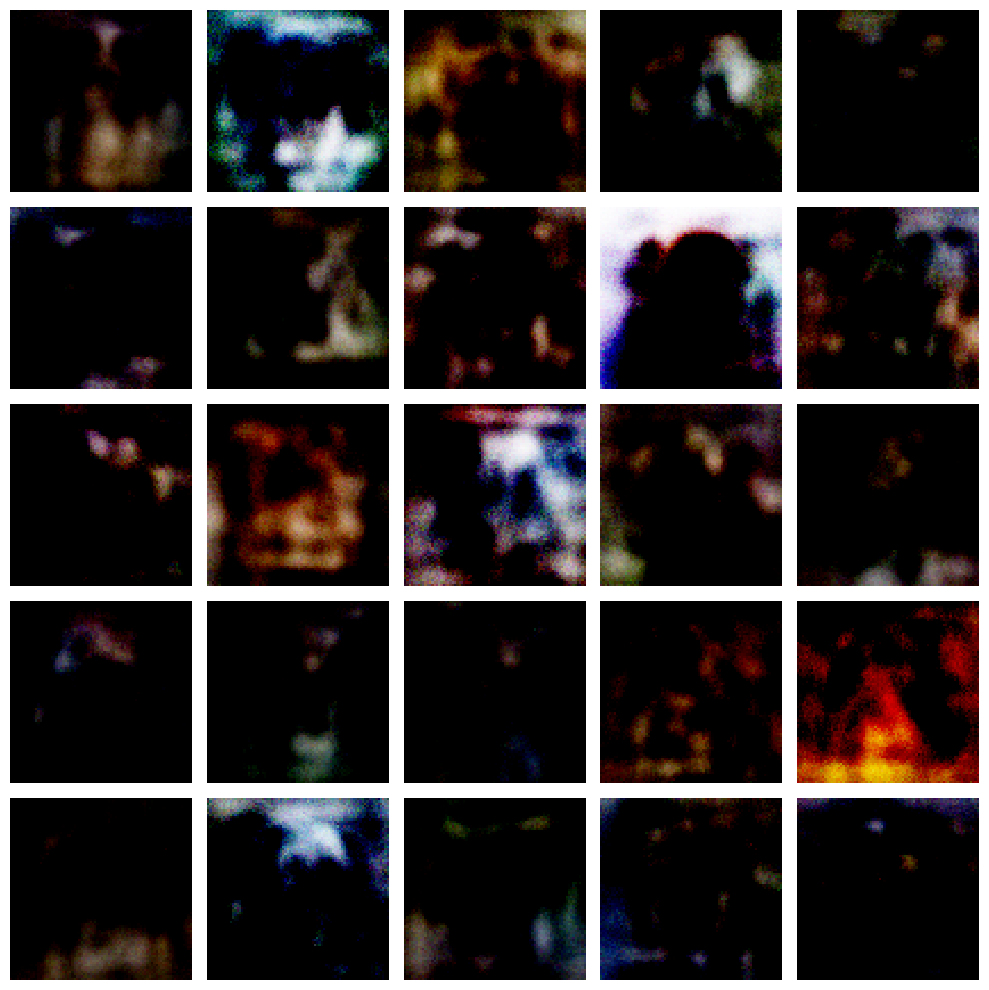

Epoch 181

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

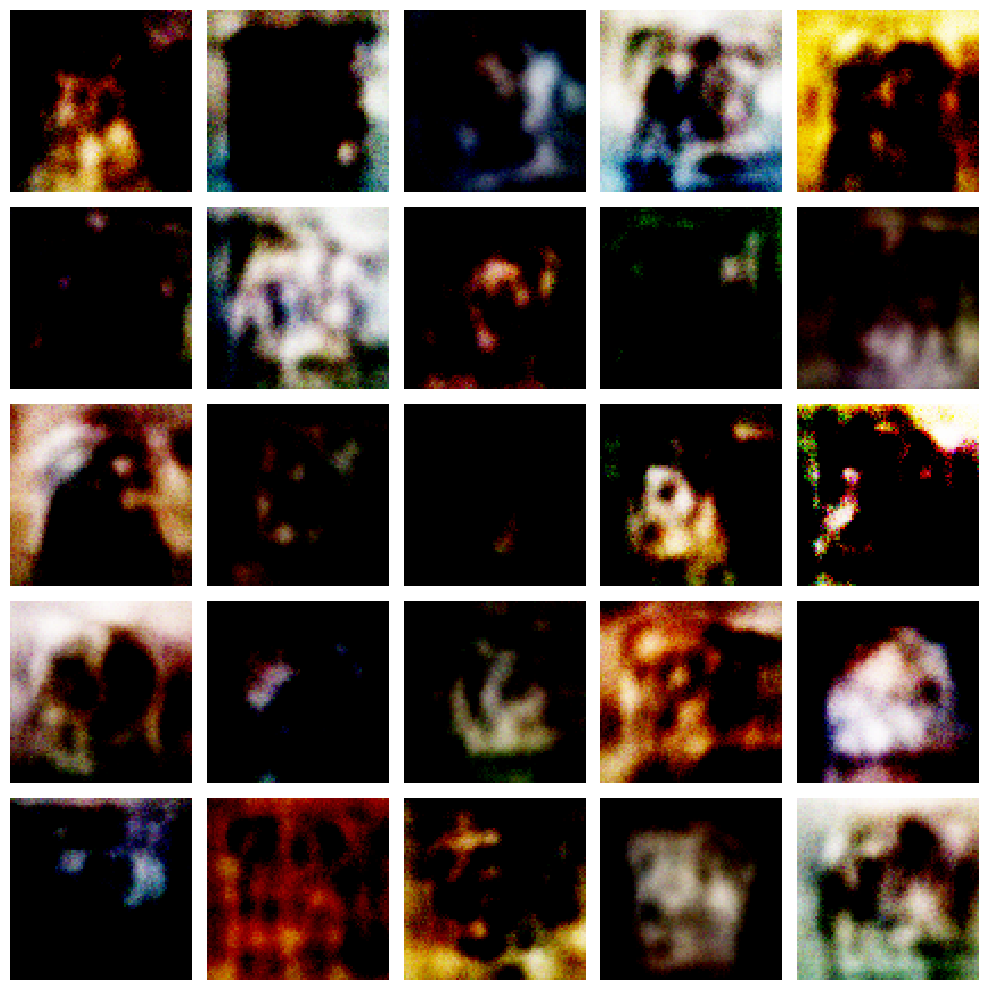

Epoch 201

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

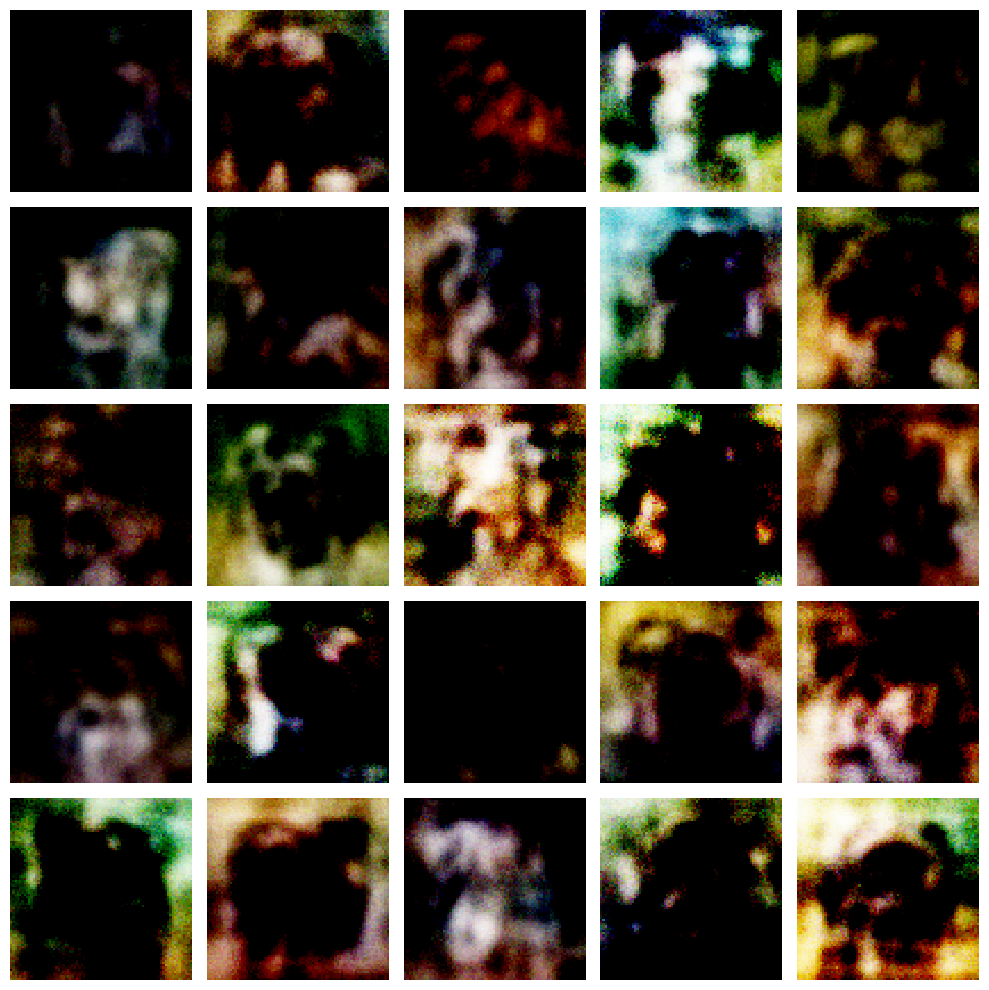

Epoch 221

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 3ms/step

4/4 [==============================] - 0s 3ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 3ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

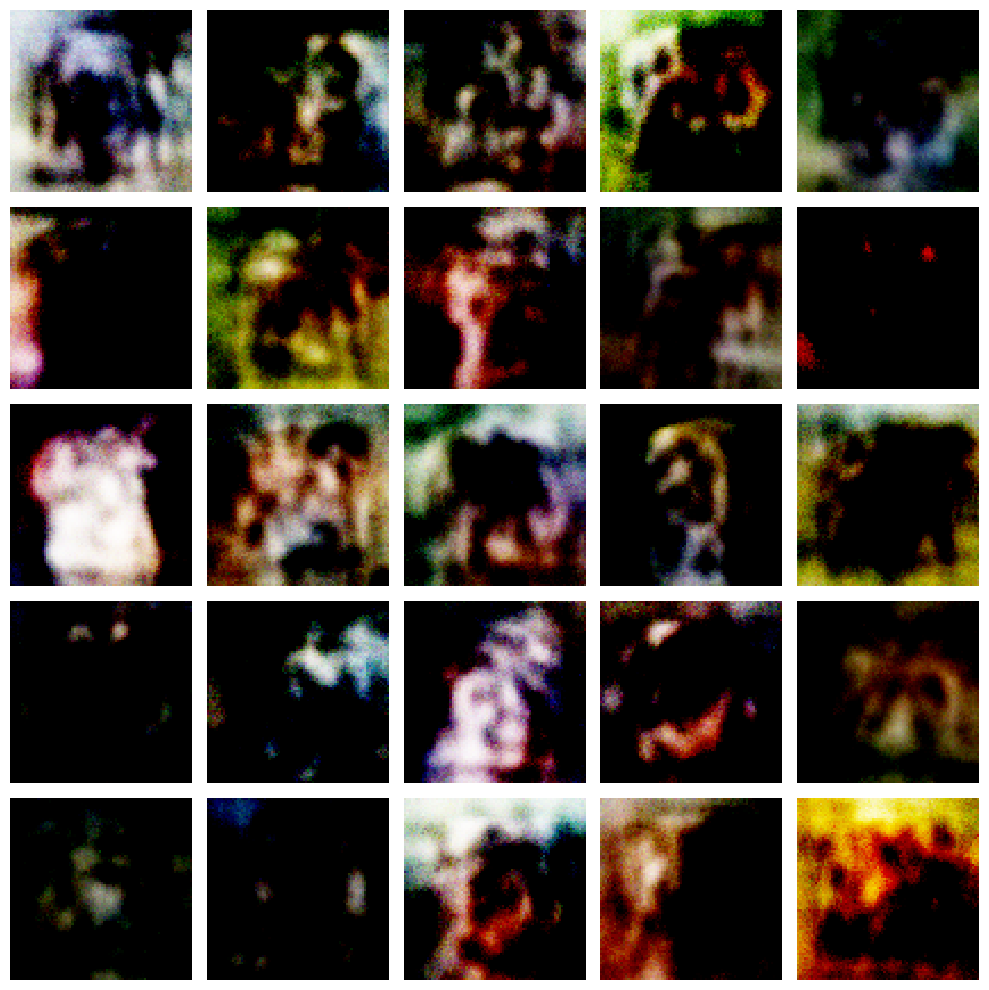

Epoch 241

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

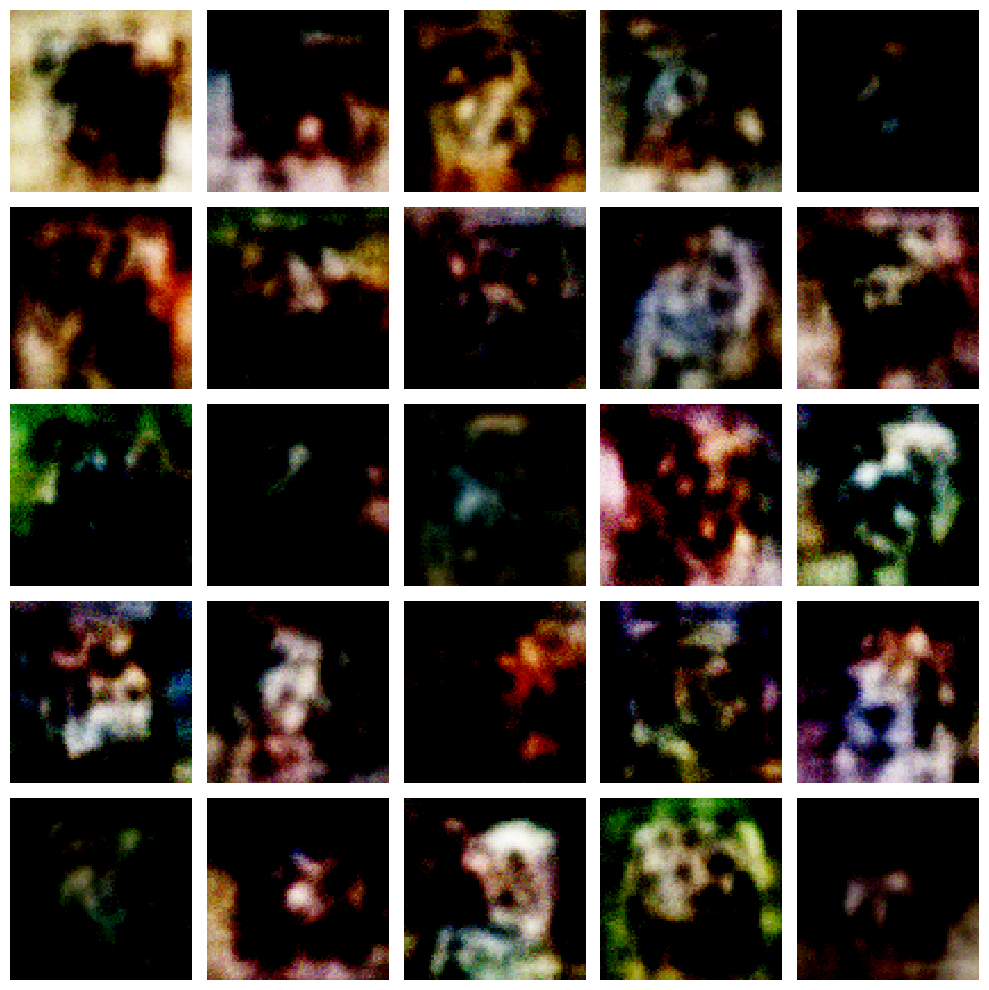

Epoch 261

4/4 [==============================] - 0s 5ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

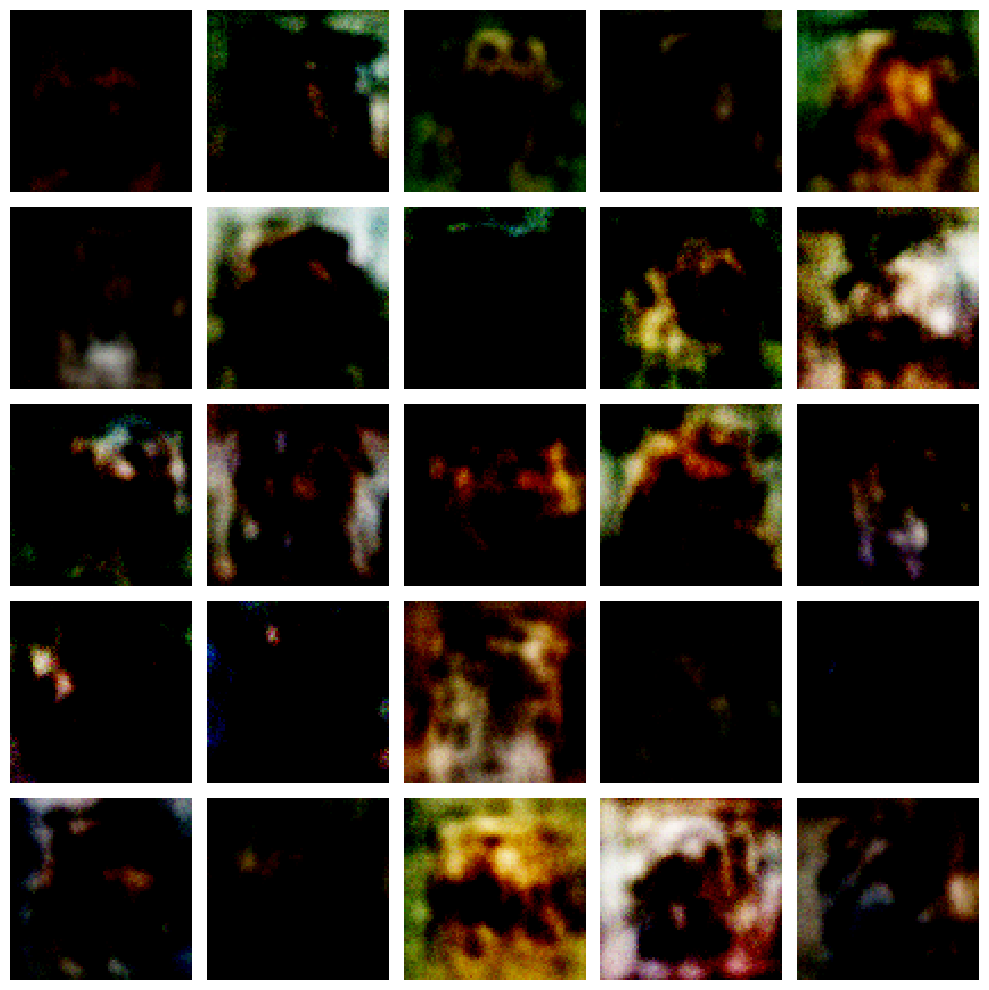

Epoch 281

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 8ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

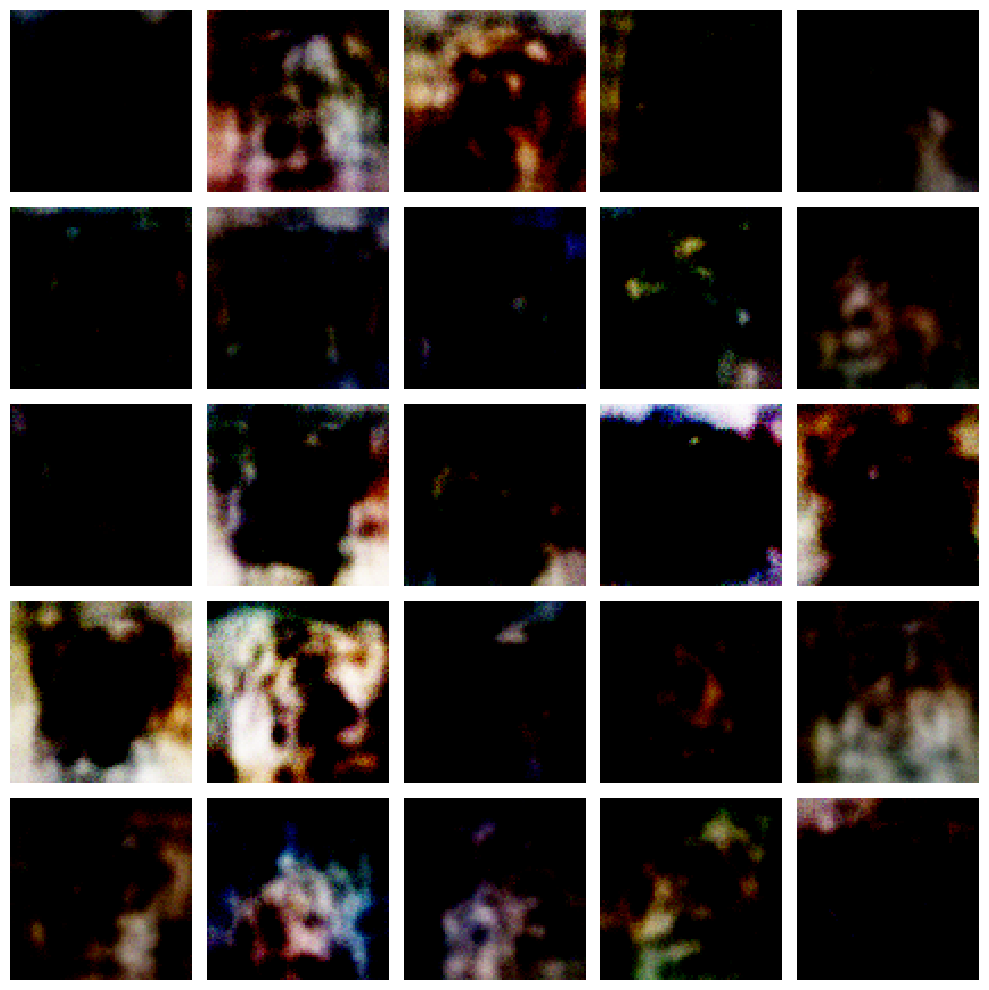

Epoch 301

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

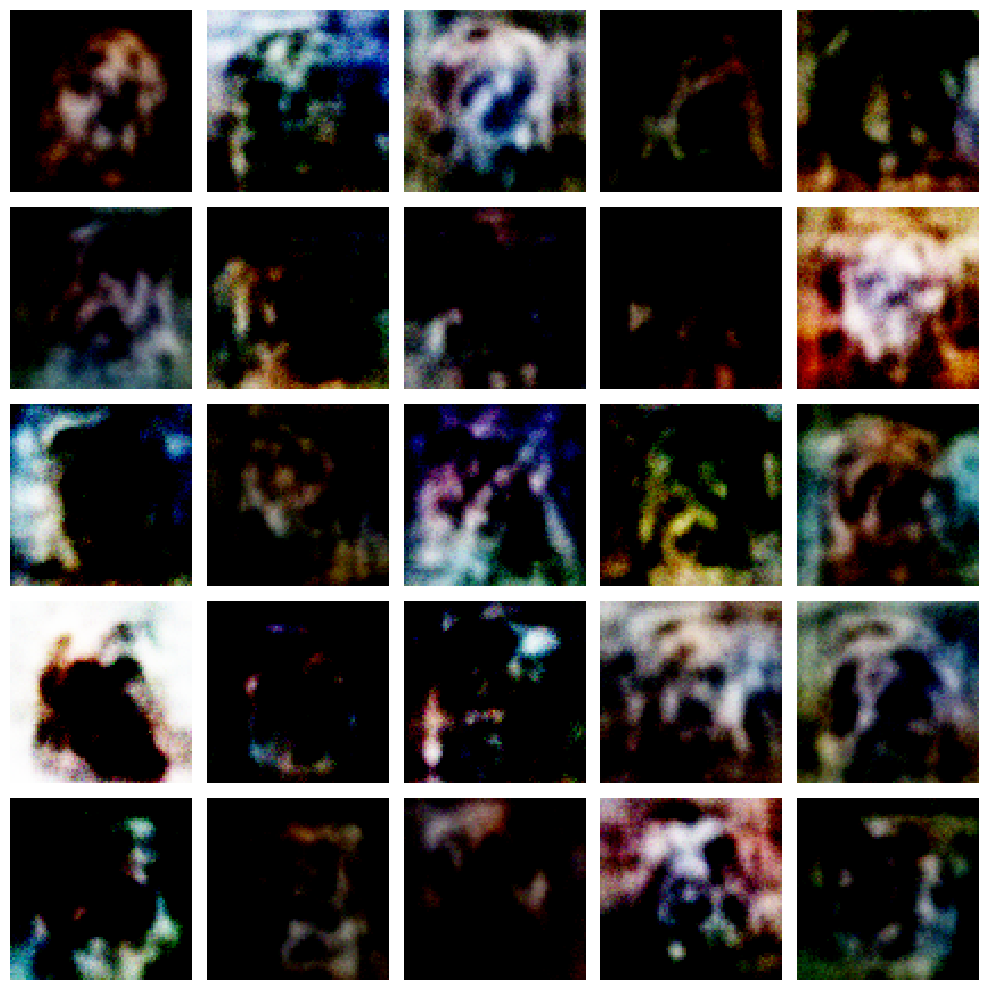

Epoch 321

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

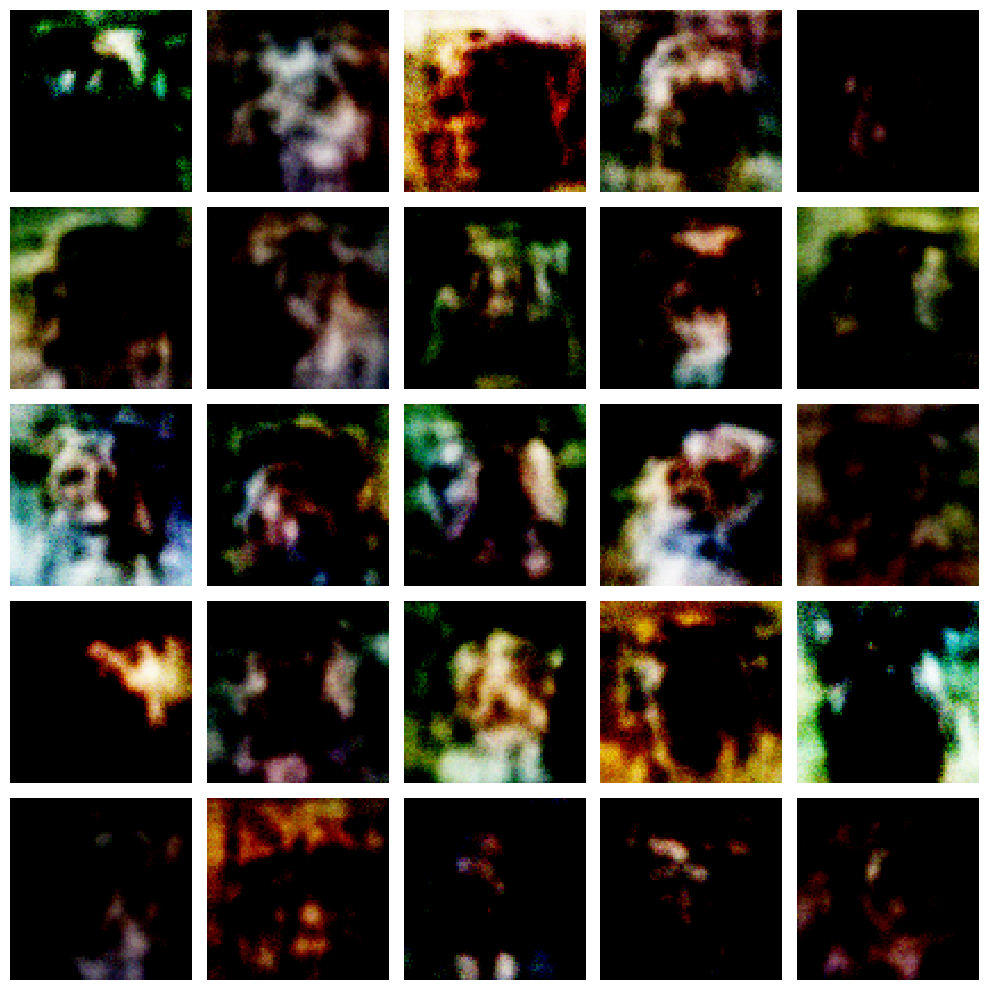

Epoch 341

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

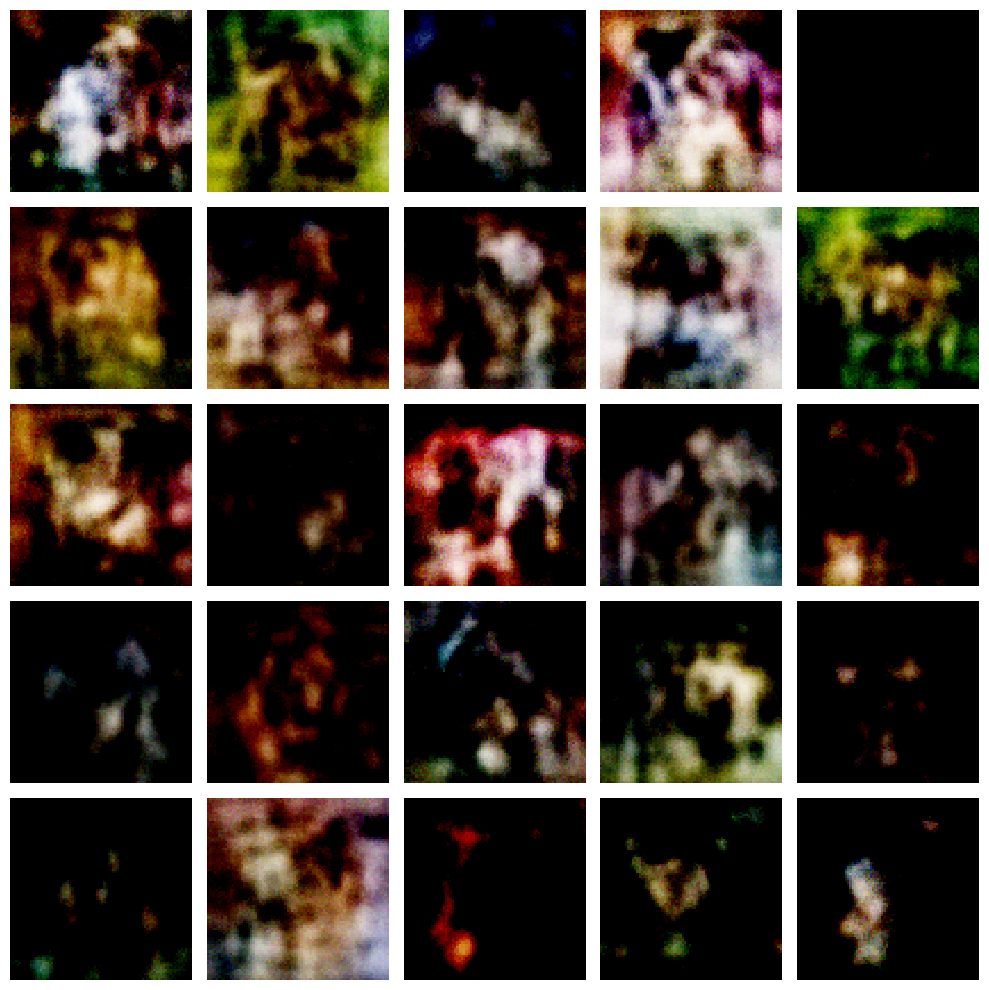

Epoch 361

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

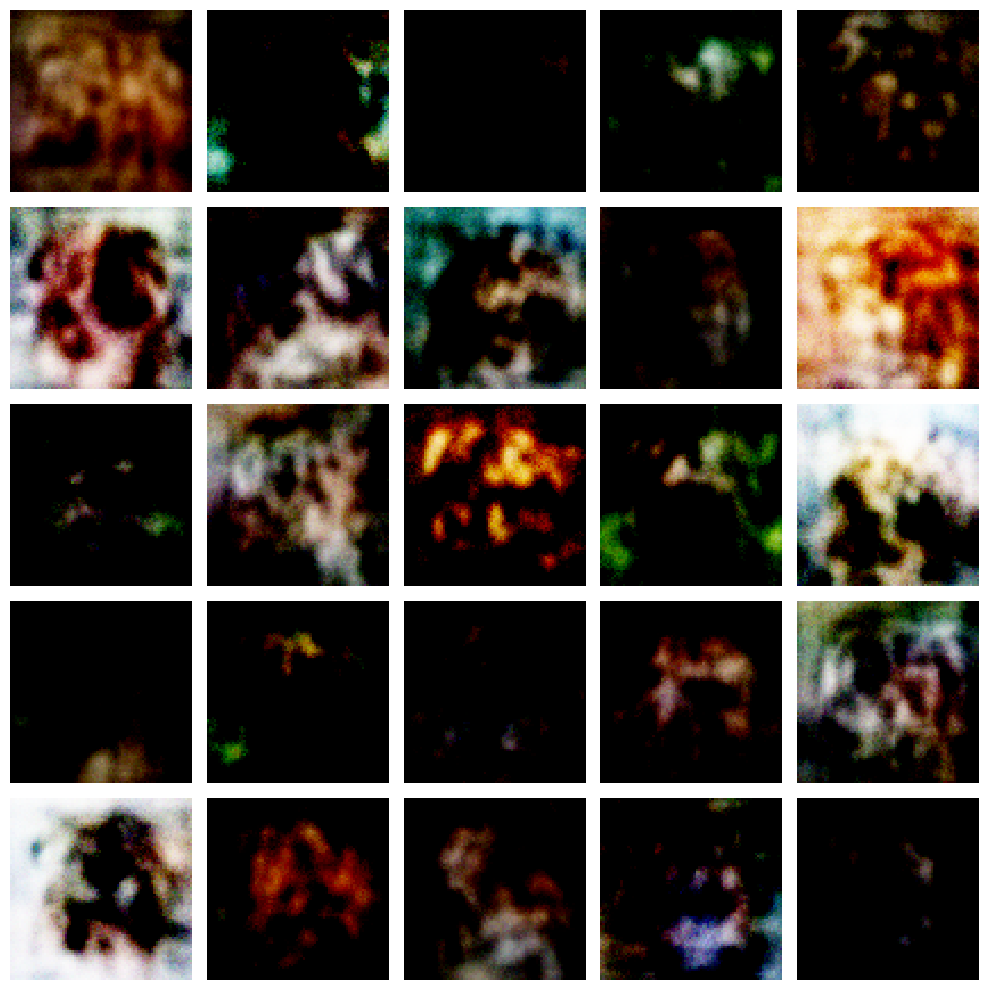

Epoch 381

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

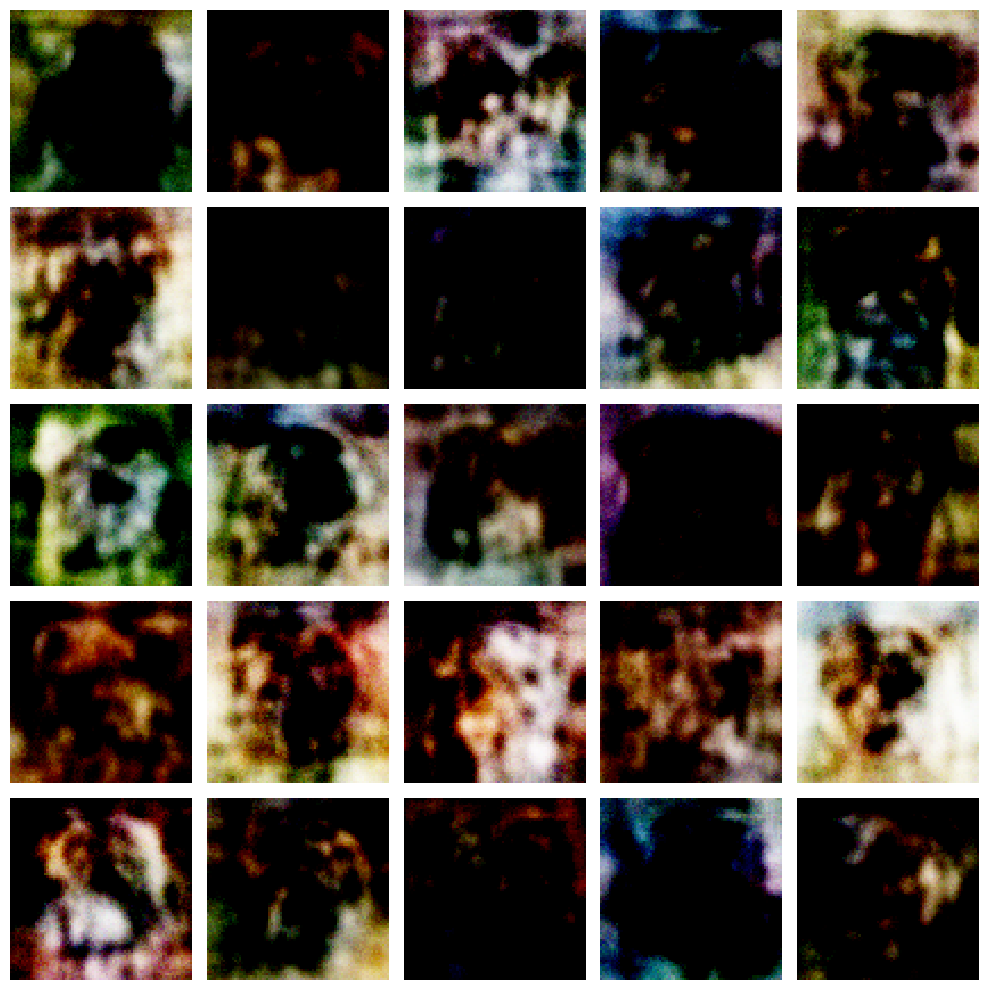

Epoch 401

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 4ms/step

4

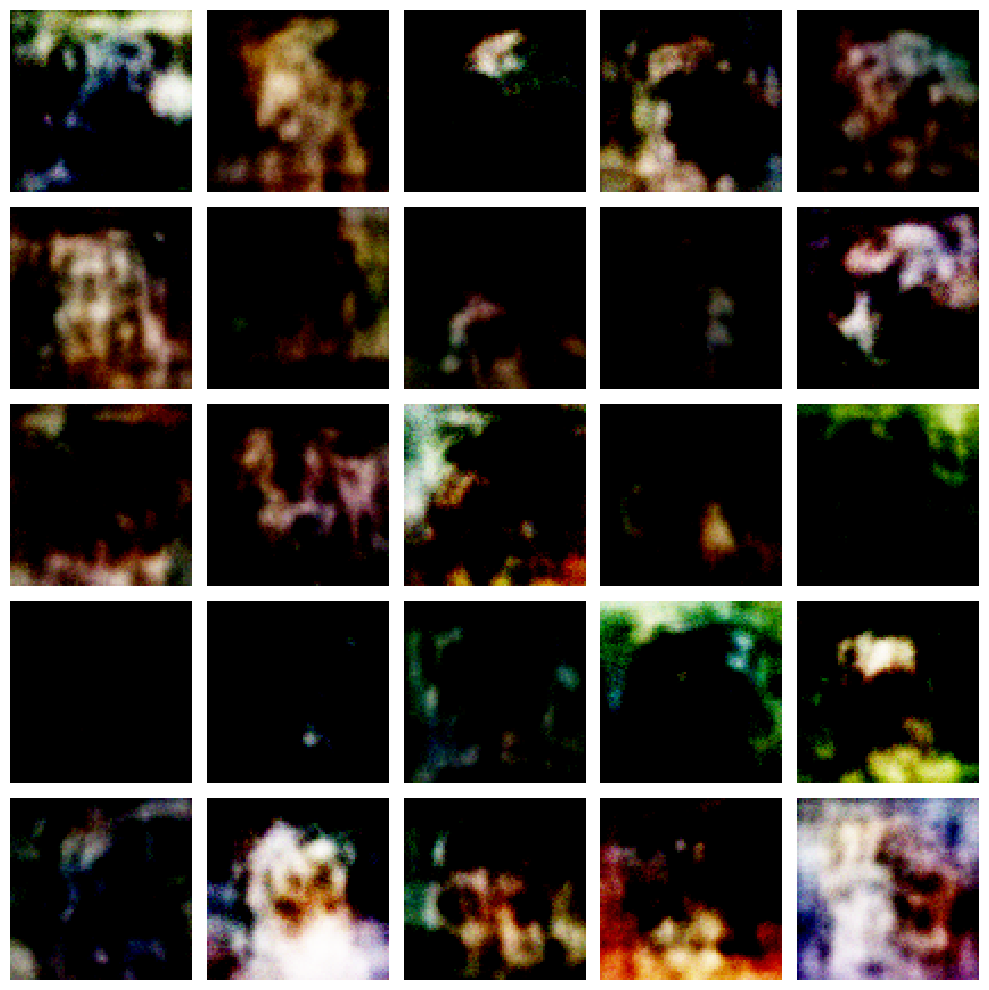

Epoch 421

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 14ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 7ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step



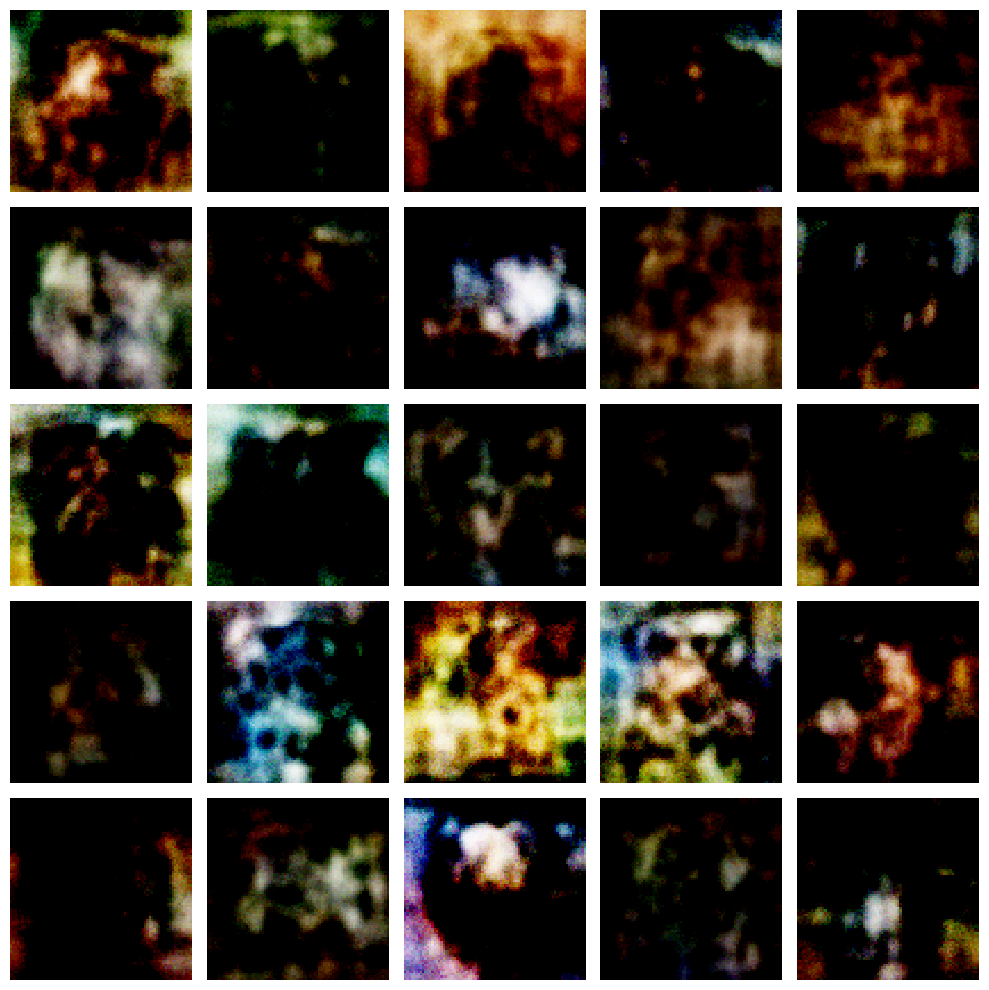

Epoch 441

4/4 [==============================] - 0s 5ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 4ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

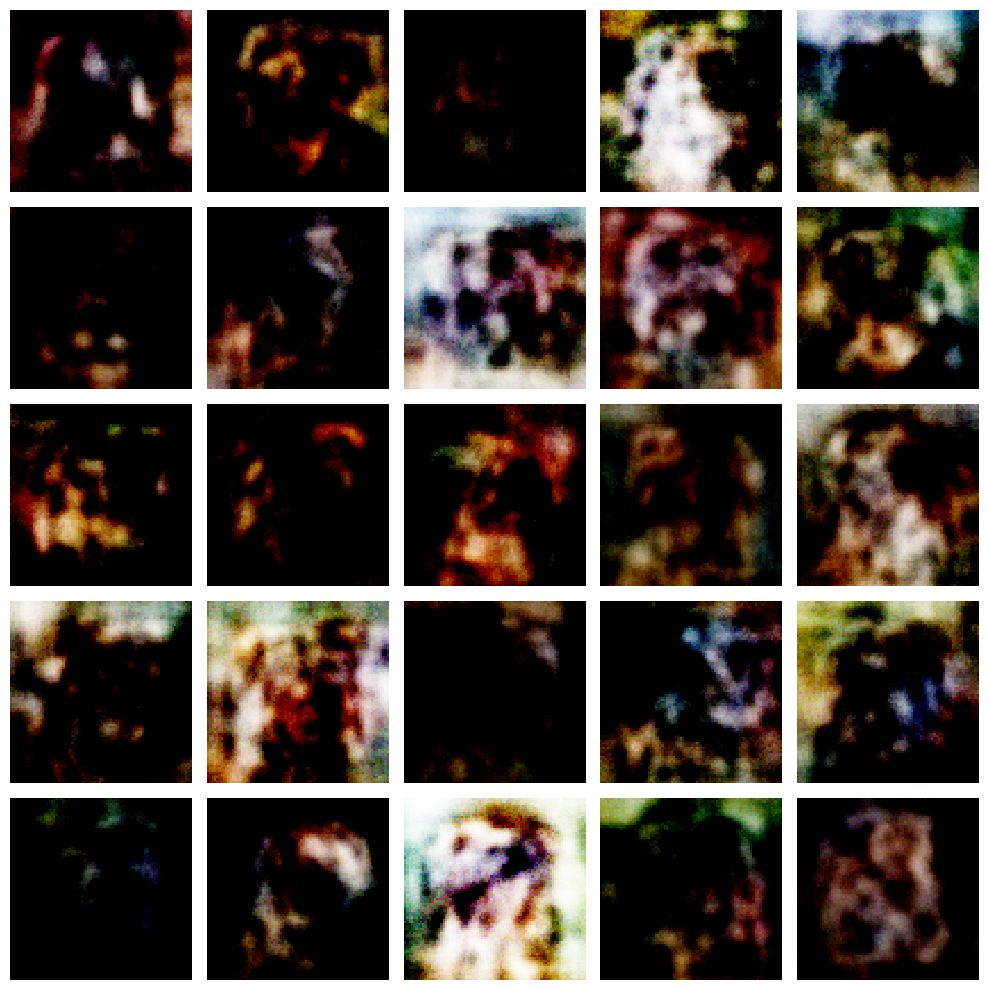

Epoch 461

4/4 [==============================] - 0s 4ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 3ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 4ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

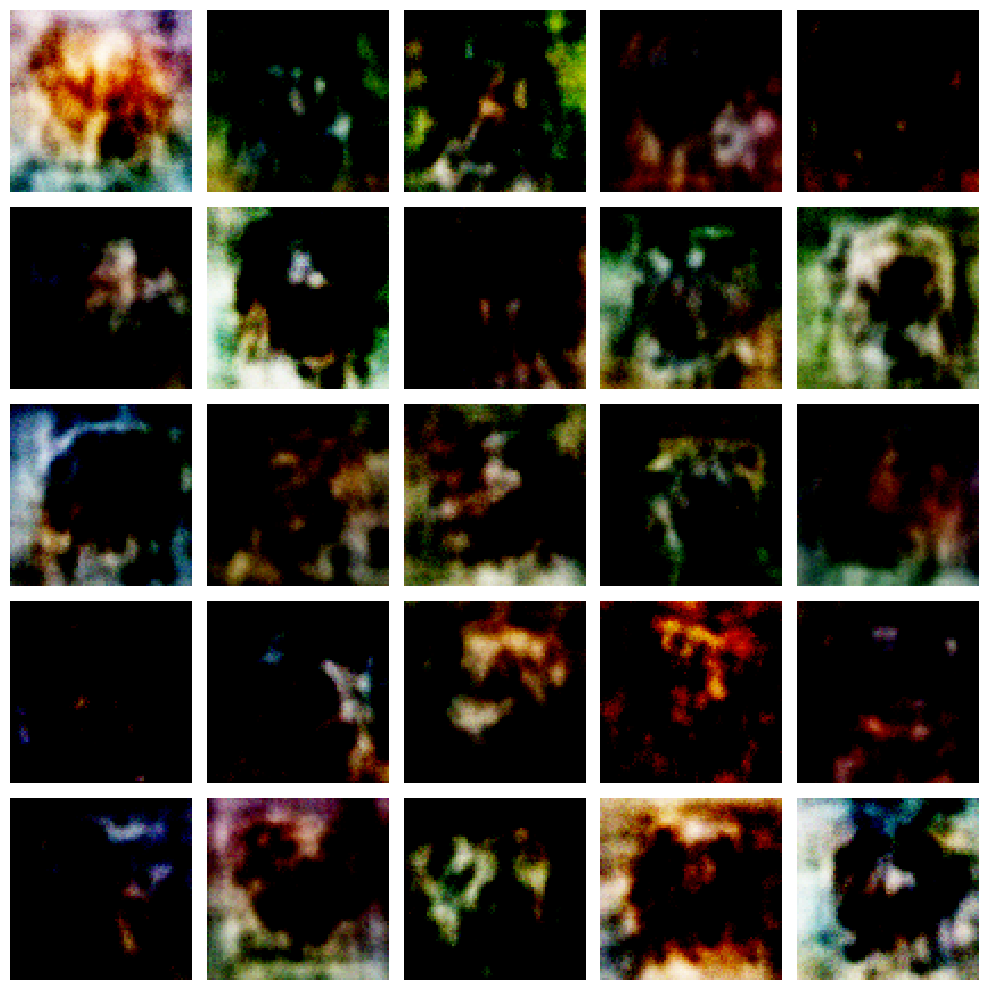

Epoch 481

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4/4 [==============================] - 0s 2ms/step

4

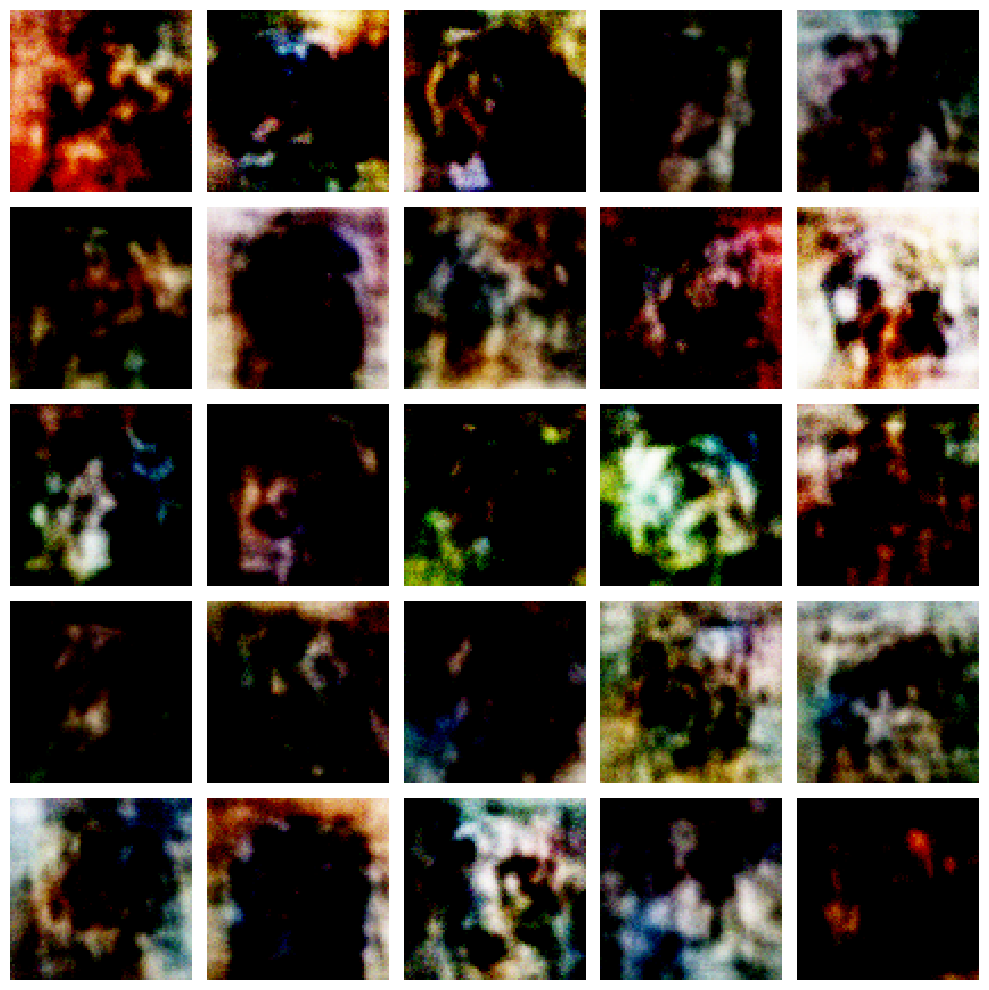

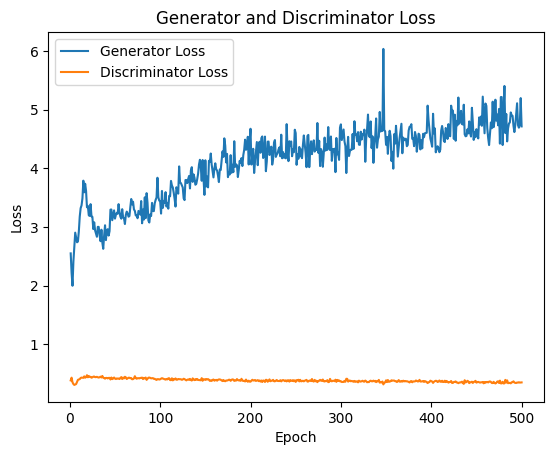

Final Accuracy: 65.31%


In [ ]:
training(500,128)

Model seems to be overfitting since the output is coming blurred and generator is failing to create synthetic samples with continuously increasing loss. This could possibly result because of simple architecture of GAN model and running high number of epochs with large batch size.